# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [216]:
splitfolders.ratio(loc,output = "output1",ratio = (0.70,0.15,0.15))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [00:09, 446.55 files/s]

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 934 images in './output1/train/cataract'.
There are 0 directories and 906 images in './output1/train/glaucoma'.
There are 0 directories and 966 images in './output1/train/normal'.
There are 0 directories and 988 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 157 images in './output1/test/cataract'.
There are 0 directories and 152 images in './output1/test/glaucoma'.
There are 0 directories and 162 images in './output1/test/normal'.
There are 0 directories and 166 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 258 images in './output1/val/cataract'.
There are 0 directories and 251 images in './output1/val/glaucoma'.
There are 0 directories and 268 images in './output1/val/norm

In [217]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [218]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch size: 16**

In [219]:
epoch = 20
batchsize = 16

In [220]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 1050 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [221]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [222]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_1  (None, 1536)              0         
 8 (GlobalAveragePooling2D)                                      
                                                                 
 dense_54 (Dense)            (None, 32)                49184     
                                                                 
 dense_55 (Dense)            (None, 4)                 132       
                                                                 
 activation_12 (Activation)  (None, 4)                 0  

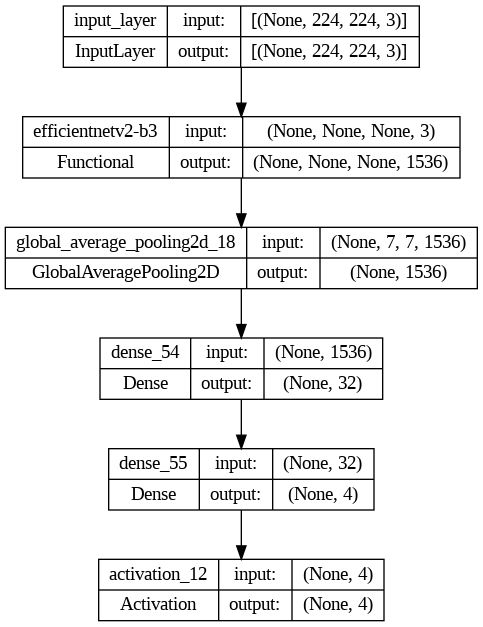

In [223]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [224]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [225]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 28s 71ms/step - loss: 0.6162 - accuracy: 0.7551 - val_loss: 0.3496 - val_accuracy: 0.8762 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 15s 61ms/step - loss: 0.4186 - accuracy: 0.8474 - val_loss: 0.2900 - val_accuracy: 0.8933 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 15s 62ms/step - loss: 0.3680 - accuracy: 0.8611 - val_loss: 0.2938 - val_accuracy: 0.8876 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 15s 62ms/step - loss: 0.3327 - accuracy: 0.8677 - val_loss: 0.2385 - val_accuracy: 0.9114 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 15s 61ms/step - loss: 0.3096 - accuracy: 0.8872 - val_loss: 0.2716 - val_accuracy: 0.8952 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 15s 61ms/step - loss: 0.3028 - accuracy: 0.8819 - val_loss: 0.2291 - val_accuracy: 0.9133 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 15s 

EfficientNetV2B3 Evaluation

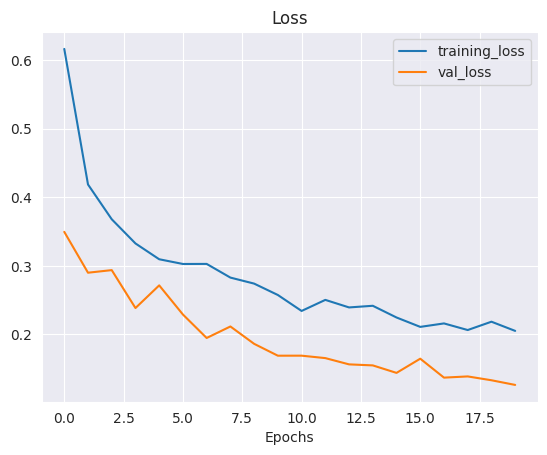

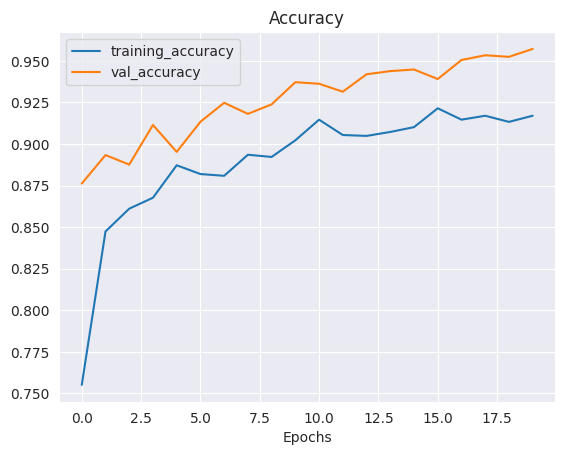

In [226]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 2s 45ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       157
           1       1.00      1.00      1.00       166
           2       0.89      0.91      0.90       152
           3       0.93      0.91      0.92       162

    accuracy                           0.95       637
   macro avg       0.95      0.95      0.95       637
weighted avg       0.95      0.95      0.95       637

Specificity: [0.31611570247933884, 0.3524416135881104, 0.2791164658634538, 0.3]
Mean Squared Error: : 0.10280673205852509
The average AUC-ROC is 0.9932128638320045


[0.9916666666666667,
 0.6666666666666666,
 0.6798336798336798,
 0.6743215031315241,
 0.6541666666666667,
 1.0,
 0.6548856548856549,
 0.6534446764091858,
 0.6895833333333333,
 0.6772823779193206,
 0.972972972972973,
 0.7035490605427975,
 0.6645833333333333,
 0.6560509554140127,
 0.6923076923076923,
 0.9686847599164927]

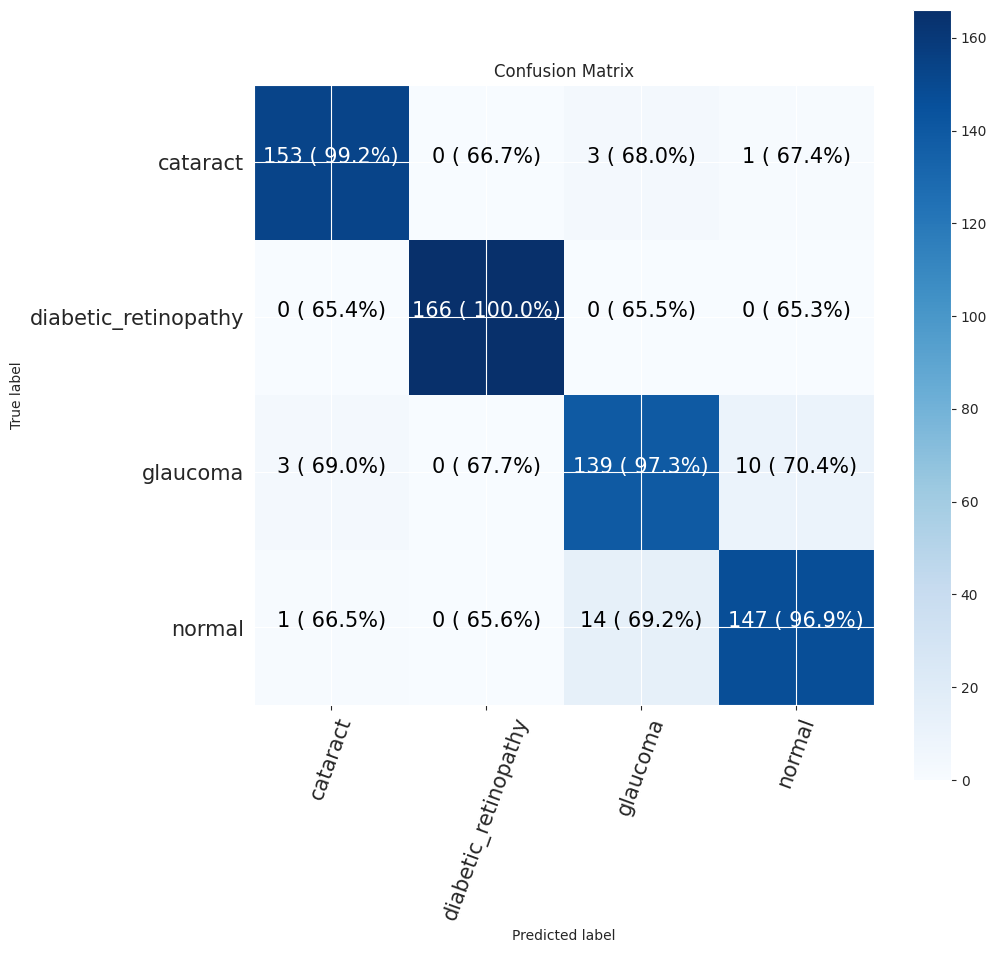

In [227]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


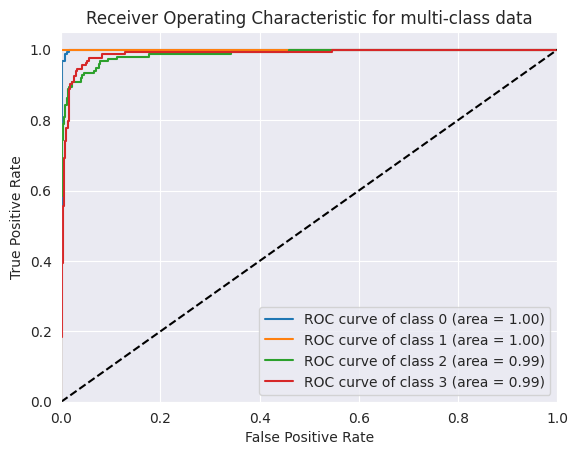

In [228]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [229]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_31 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_32 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 26, 26, 128)      

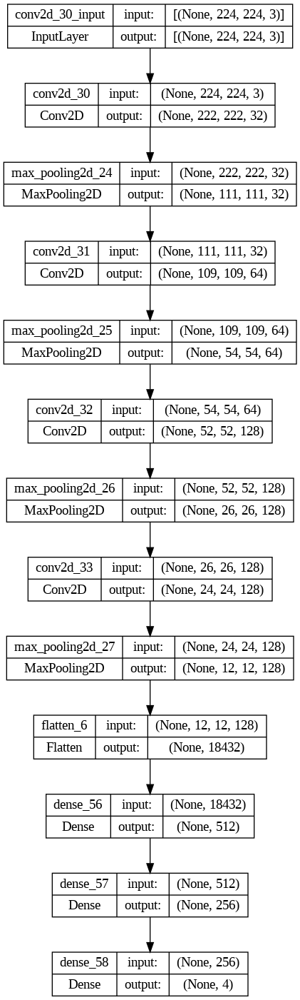

In [230]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [231]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [232]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 10s 31ms/step - loss: 1.0233 - accuracy: 0.6144 - val_loss: 0.2958 - val_accuracy: 0.7095 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 7s 31ms/step - loss: 0.3000 - accuracy: 0.7032 - val_loss: 0.2960 - val_accuracy: 0.6867 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 7s 31ms/step - loss: 0.3115 - accuracy: 0.7022 - val_loss: 0.2746 - val_accuracy: 0.7143 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 7s 31ms/step - loss: 0.2723 - accuracy: 0.7206 - val_loss: 0.2608 - val_accuracy: 0.7448 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 7s 31ms/step - loss: 0.3599 - accuracy: 0.7116 - val_loss: 0.2648 - val_accuracy: 0.7524 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 7s 30ms/step - loss: 0.2781 - accuracy: 0.7251 - val_loss: 0.2608 - val_accuracy: 0.7295 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 7s 30ms/s

CNN Evaluation

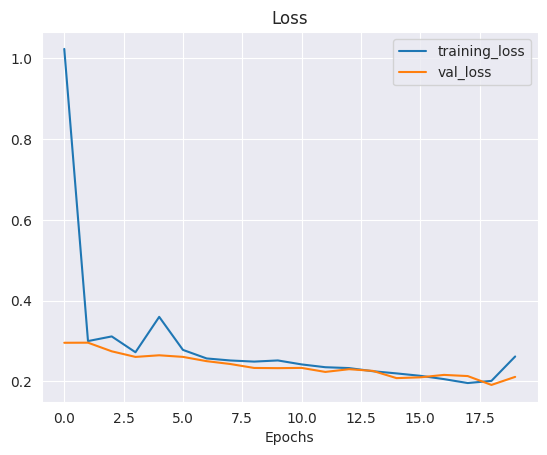

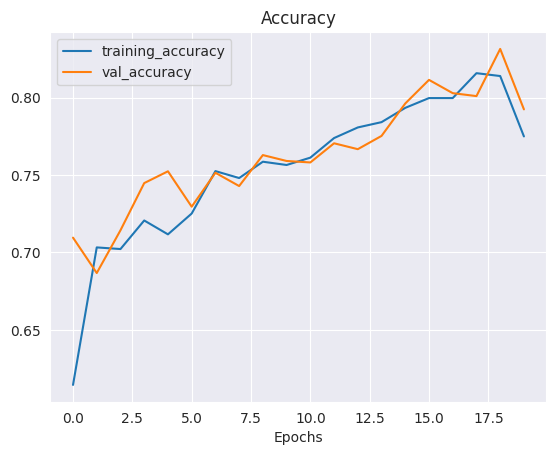

In [233]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 0s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.37      0.48       157
           1       1.00      0.99      0.99       166
           2       0.55      0.67      0.61       152
           3       0.71      0.90      0.80       162

    accuracy                           0.74       637
   macro avg       0.74      0.73      0.72       637
weighted avg       0.75      0.74      0.72       637

Specificity: [0.1001727115716753, 0.346723044397463, 0.19065420560747665, 0.2973523421588595]
Mean Squared Error: : 0.13096950948238373
The average AUC-ROC is 0.9085249833430129


[0.8212996389891697,
 0.6680761099365751,
 0.8008849557522124,
 0.7106481481481481,
 0.7003610108303249,
 0.9957716701902748,
 0.6371681415929203,
 0.6157407407407407,
 0.7671480144404332,
 0.678646934460888,
 0.8893805309734514,
 0.7106481481481481,
 0.7111913357400722,
 0.6575052854122622,
 0.672566371681416,
 0.9629629629629629]

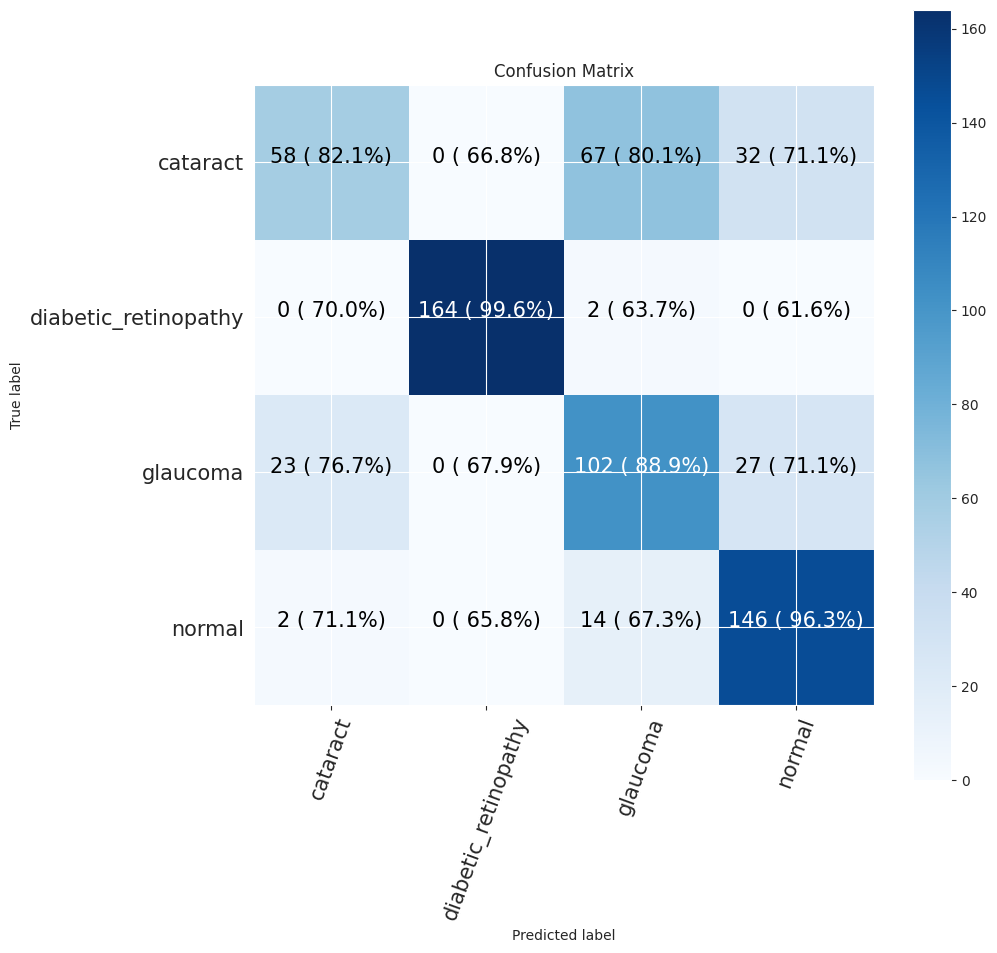

In [234]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


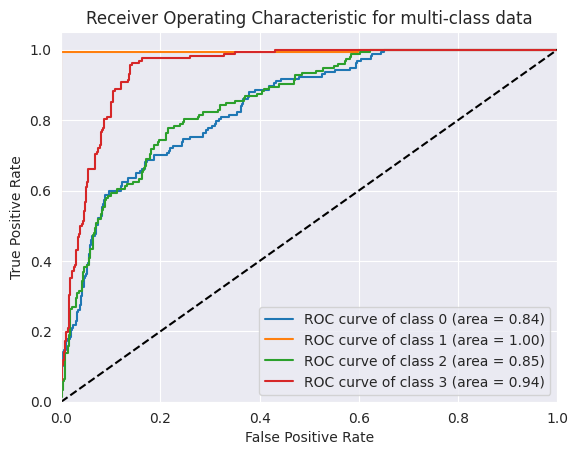

In [235]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [236]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [237]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_27 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_34 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 9 (GlobalAveragePooling2D)                                      
                                                                 
 dense_59 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_60 (Dense)            (None, 4)                 4100      
                                                          

In [238]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

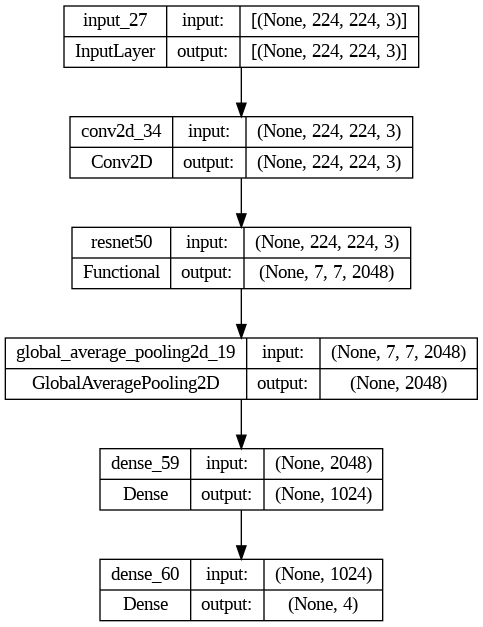

In [239]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [240]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [241]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 40s 150ms/step - loss: 0.2700 - accuracy: 0.7733 - val_loss: 0.1470 - val_accuracy: 0.8857 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 35s 145ms/step - loss: 0.1611 - accuracy: 0.8777 - val_loss: 0.1692 - val_accuracy: 0.8524 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 35s 146ms/step - loss: 0.1353 - accuracy: 0.8925 - val_loss: 0.1334 - val_accuracy: 0.8933 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 35s 145ms/step - loss: 0.1244 - accuracy: 0.9035 - val_loss: 0.0928 - val_accuracy: 0.9286 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 35s 145ms/step - loss: 0.1097 - accuracy: 0.9114 - val_loss: 0.0786 - val_accuracy: 0.9400 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 35s 145ms/step - loss: 0.0998 - accuracy: 0.9222 - val_loss: 0.0872 - val_accuracy: 0.9419 - lr: 0.0010
Epoch 7/20
238/238 [==============================] 

ResNet50 Evaluation

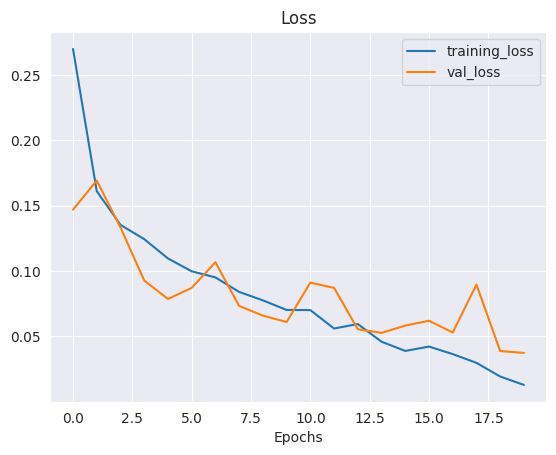

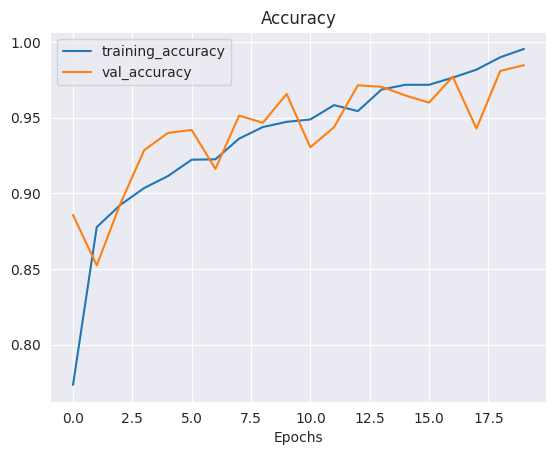

In [242]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 2s 50ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       157
           1       1.00      0.99      0.99       166
           2       0.91      0.91      0.91       152
           3       0.93      0.91      0.92       162

    accuracy                           0.95       637
   macro avg       0.95      0.95      0.95       637
weighted avg       0.95      0.95      0.95       637

Specificity: [0.3188405797101449, 0.346723044397463, 0.27655310621242485, 0.3]
Mean Squared Error: : 0.10008659958839417
The average AUC-ROC is 0.9898773726620373


[0.9936575052854123,
 0.6680761099365751,
 0.6810699588477366,
 0.6743215031315241,
 0.6490486257928119,
 0.9957716701902748,
 0.6604938271604939,
 0.6555323590814196,
 0.6892177589852009,
 0.678646934460888,
 0.9711934156378601,
 0.7014613778705637,
 0.6680761099365751,
 0.6575052854122622,
 0.6872427983539094,
 0.9686847599164927]

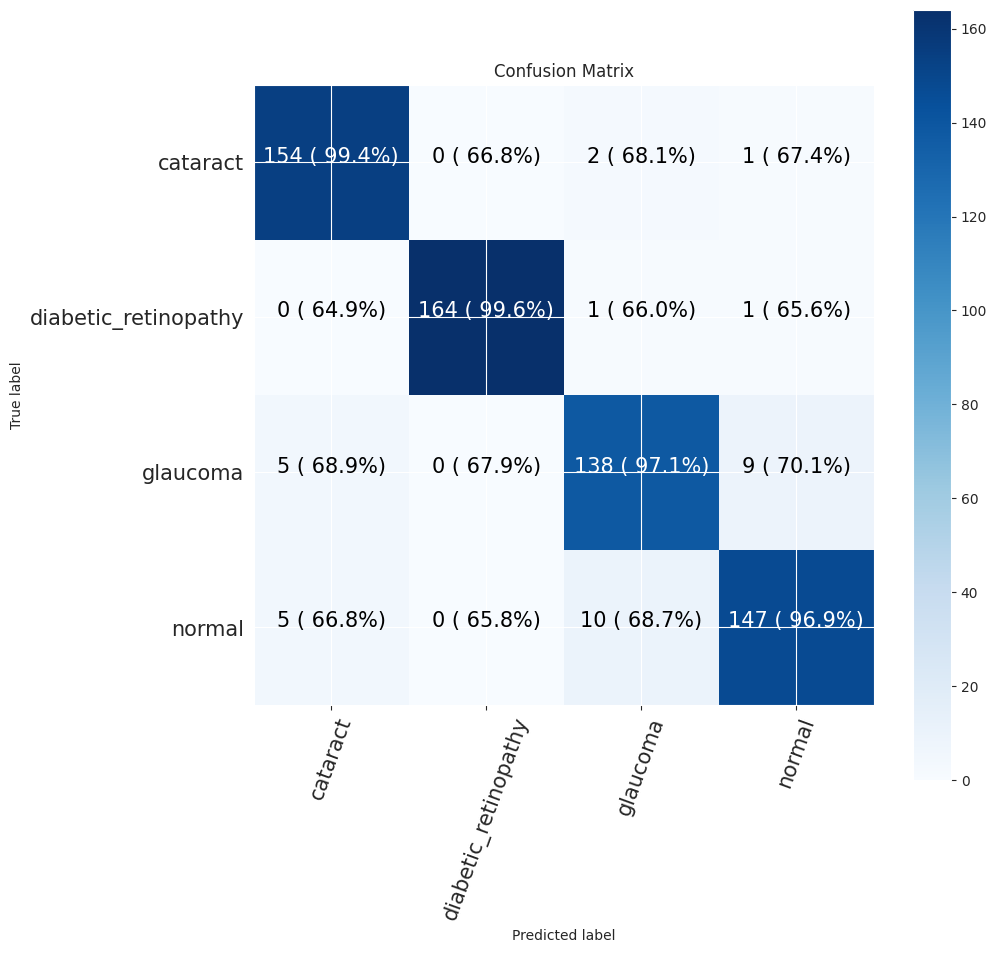

In [243]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


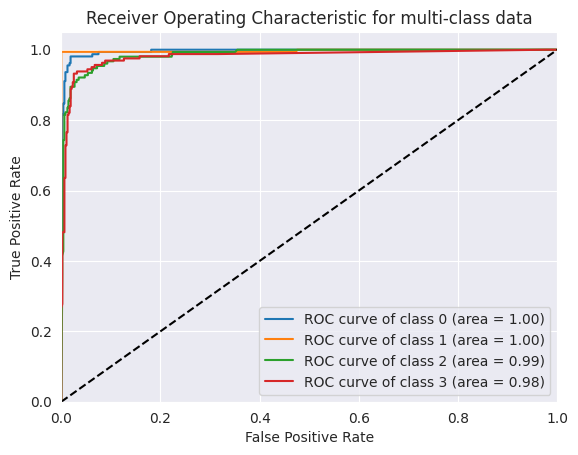

In [244]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [245]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [246]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



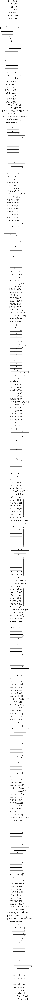

In [247]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [248]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 0 (GlobalAveragePooling2D)                                      
                                                                 
 dense_61 (Dense)            (None, 32)                65568     
                                                                 
 dense_62 (Dense)            (None, 4)                 132       
                                                                 
 activation_13 (Activation)  (None, 4)                 0  

In [249]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [250]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 34s 119ms/step - loss: 0.5317 - accuracy: 0.7905 - val_loss: 0.3663 - val_accuracy: 0.8581 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 26s 111ms/step - loss: 0.3410 - accuracy: 0.8716 - val_loss: 0.2551 - val_accuracy: 0.8971 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 26s 109ms/step - loss: 0.2793 - accuracy: 0.8930 - val_loss: 0.2311 - val_accuracy: 0.9057 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 26s 109ms/step - loss: 0.2491 - accuracy: 0.9088 - val_loss: 0.2252 - val_accuracy: 0.9095 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 26s 110ms/step - loss: 0.2157 - accuracy: 0.9162 - val_loss: 0.1788 - val_accuracy: 0.9371 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 26s 110ms/step - loss: 0.1858 - accuracy: 0.9315 - val_loss: 0.2258 - val_accuracy: 0.9114 - lr: 0.0010
Epoch 7/20
238/238 [==============================] 

ResNet50 Evaluation

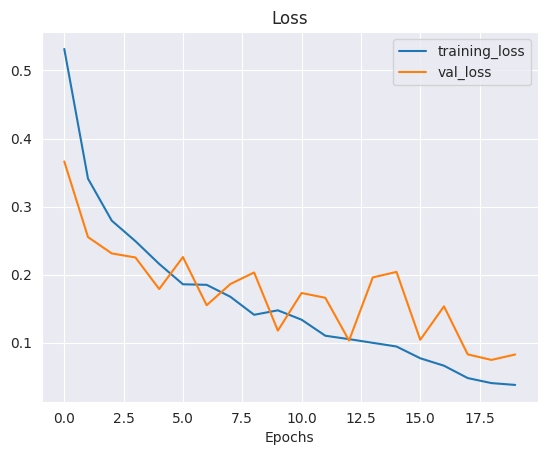

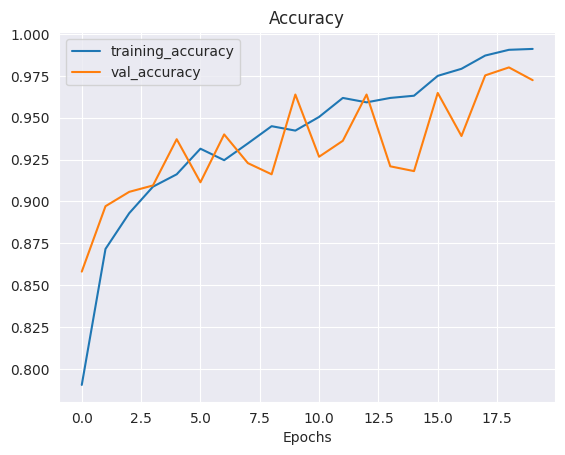

In [251]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 3s 82ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.92      0.95       157
           1       1.00      0.98      0.99       166
           2       0.86      0.96      0.91       152
           3       0.94      0.91      0.92       162

    accuracy                           0.94       637
   macro avg       0.95      0.94      0.94       637
weighted avg       0.95      0.94      0.94       637

Specificity: [0.29471544715447157, 0.3438818565400844, 0.2973523421588595, 0.3]
Mean Squared Error: : 0.1026936024427414
The average AUC-ROC is 0.9928925899766684


[0.9754601226993865,
 0.6687763713080169,
 0.6895074946466809,
 0.6735966735966736,
 0.6605316973415133,
 0.9936708860759493,
 0.6445396145610278,
 0.6611226611226612,
 0.689161554192229,
 0.679324894514768,
 0.987152034261242,
 0.6964656964656964,
 0.6748466257668712,
 0.6582278481012658,
 0.6788008565310493,
 0.9688149688149689]

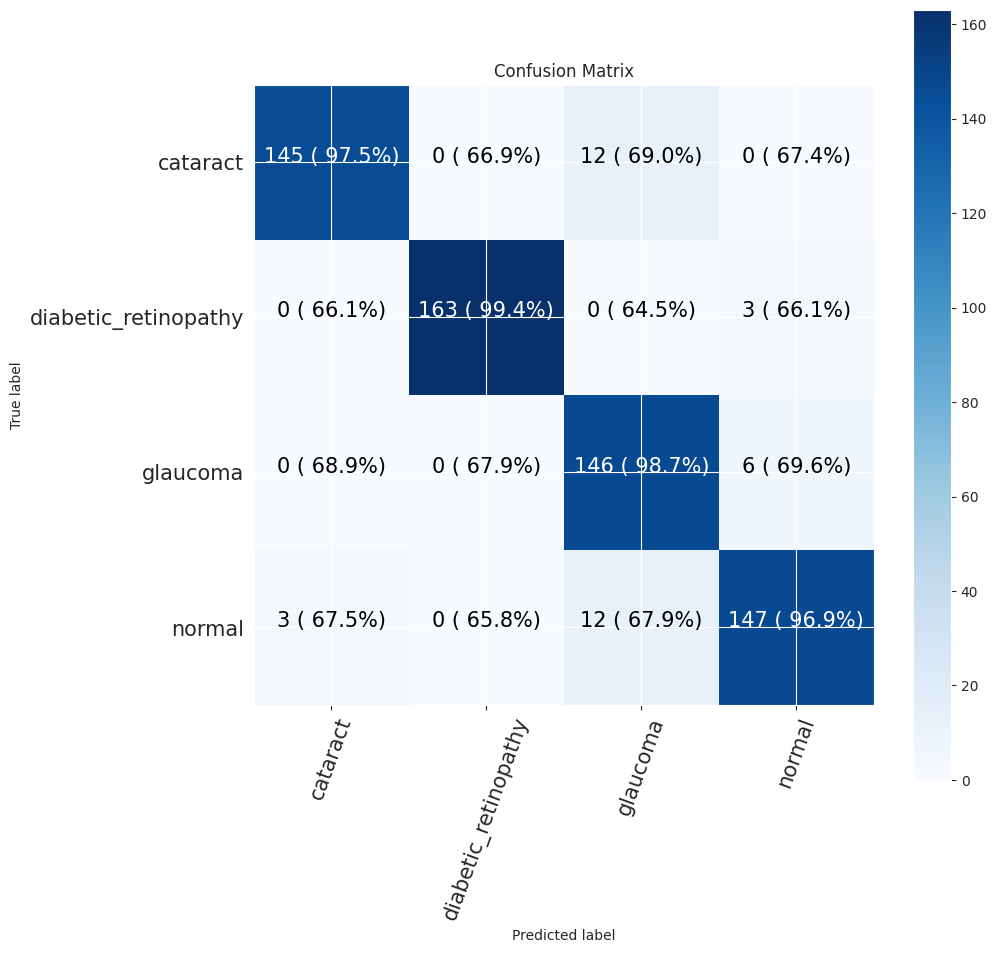

In [252]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


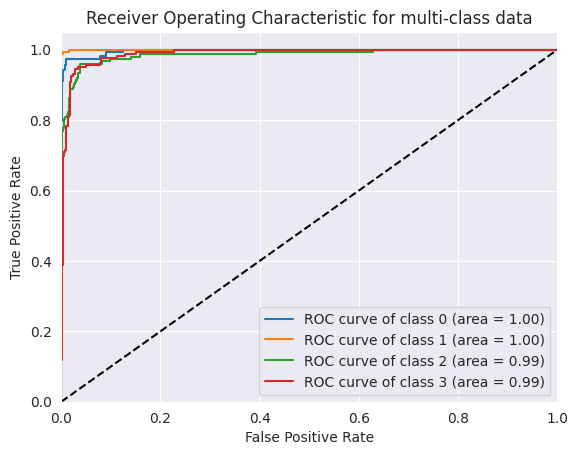

In [253]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 32**

In [254]:
epoch = 20
batchsize = 32

In [255]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 1050 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [256]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [257]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_2  (None, 1536)              0         
 1 (GlobalAveragePooling2D)                                      
                                                                 
 dense_63 (Dense)            (None, 32)                49184     
                                                                 
 dense_64 (Dense)            (None, 4)                 132       
                                                                 
 activation_14 (Activation)  (None, 4)                 0  

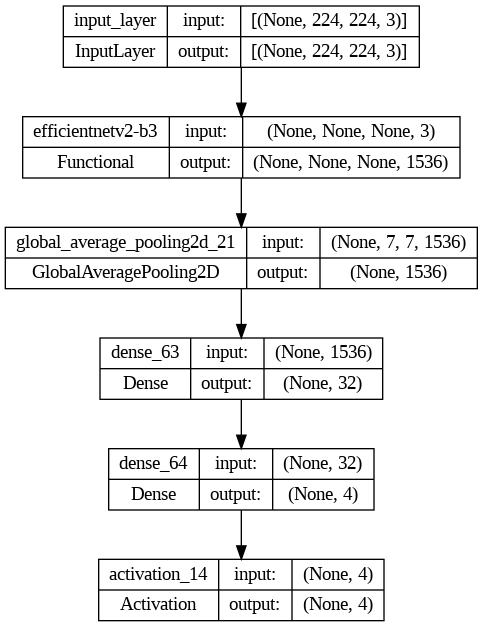

In [258]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [259]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [260]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 29s 147ms/step - loss: 0.5968 - accuracy: 0.7586 - val_loss: 0.3691 - val_accuracy: 0.8714 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 14s 113ms/step - loss: 0.4224 - accuracy: 0.8316 - val_loss: 0.3679 - val_accuracy: 0.8610 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 14s 113ms/step - loss: 0.3654 - accuracy: 0.8595 - val_loss: 0.2989 - val_accuracy: 0.8857 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 14s 113ms/step - loss: 0.3453 - accuracy: 0.8669 - val_loss: 0.2498 - val_accuracy: 0.9048 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 14s 112ms/step - loss: 0.3184 - accuracy: 0.8803 - val_loss: 0.2323 - val_accuracy: 0.9143 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 13s 112ms/step - loss: 0.3044 - accuracy: 0.8859 - val_loss: 0.2114 - val_accuracy: 0.9133 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

EfficientNetV2B3 Evaluation

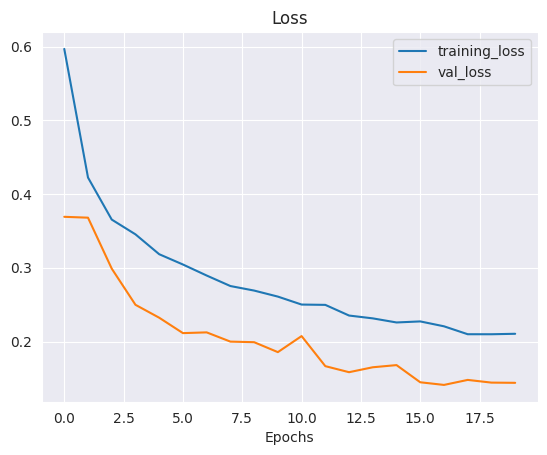

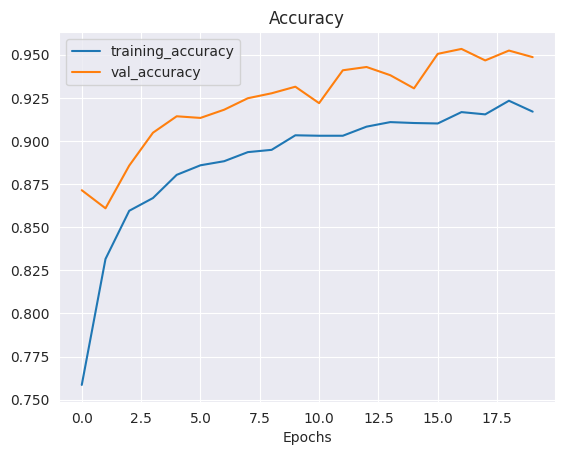

In [261]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 2s 80ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       157
           1       1.00      0.98      0.99       166
           2       0.90      0.86      0.88       152
           3       0.90      0.91      0.90       162

    accuracy                           0.93       637
   macro avg       0.93      0.93      0.93       637
weighted avg       0.93      0.93      0.93       637

Specificity: [0.3188405797101449, 0.3410526315789474, 0.25889328063241107, 0.3]
Mean Squared Error: : 0.10593817383050919
The average AUC-ROC is 0.9910990734997687


[0.9936170212765958,
 0.6694736842105263,
 0.6849593495934959,
 0.6708860759493671,
 0.6468085106382979,
 0.991578947368421,
 0.6646341463414634,
 0.6561181434599156,
 0.6957446808510638,
 0.68,
 0.9573170731707317,
 0.7046413502109705,
 0.6638297872340425,
 0.6589473684210526,
 0.693089430894309,
 0.9683544303797469]

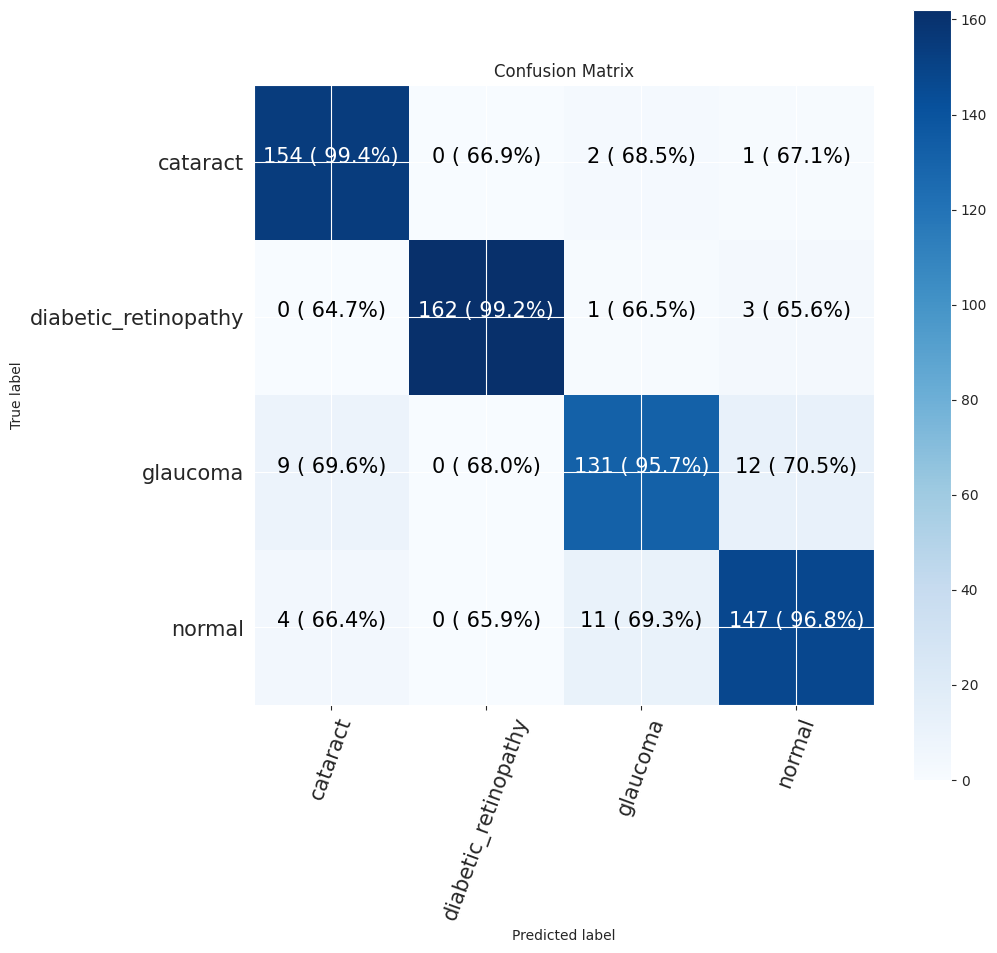

In [262]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


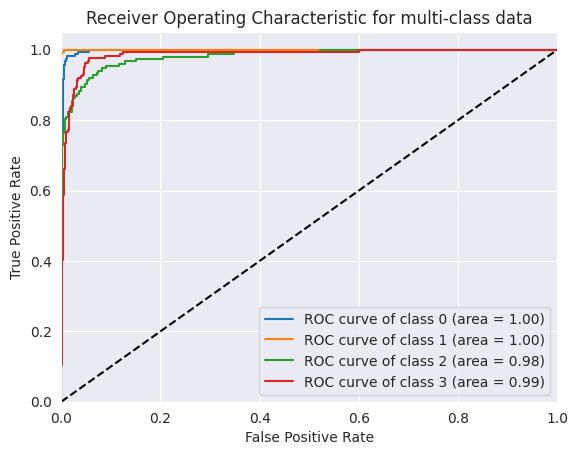

In [263]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [264]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_28 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_36 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_29 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_30 (MaxPooli  (None, 26, 26, 128)      

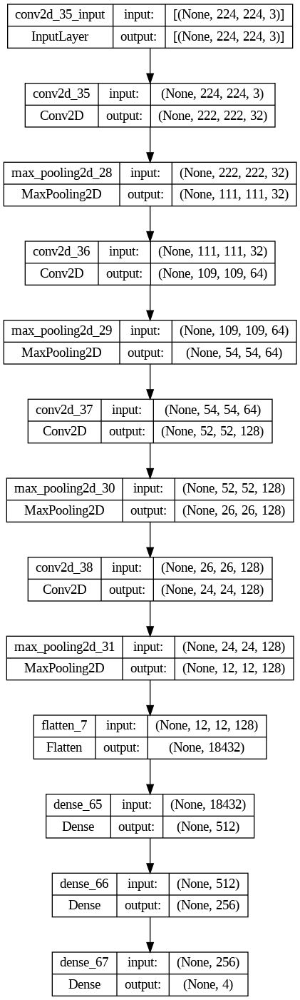

In [265]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [266]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [267]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 12s 60ms/step - loss: 0.6609 - accuracy: 0.6157 - val_loss: 0.2429 - val_accuracy: 0.7867 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 7s 54ms/step - loss: 0.2436 - accuracy: 0.7910 - val_loss: 0.2048 - val_accuracy: 0.8219 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 7s 54ms/step - loss: 0.2109 - accuracy: 0.8150 - val_loss: 0.1938 - val_accuracy: 0.8333 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 7s 55ms/step - loss: 0.1844 - accuracy: 0.8432 - val_loss: 0.1736 - val_accuracy: 0.8467 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 7s 54ms/step - loss: 0.1847 - accuracy: 0.8442 - val_loss: 0.1719 - val_accuracy: 0.8590 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 7s 54ms/step - loss: 0.1719 - accuracy: 0.8582 - val_loss: 0.1689 - val_accuracy: 0.8457 - lr: 0.0010
Epoch 7/20
119/119 [==============================] - 7s 54ms/s

CNN Evaluation

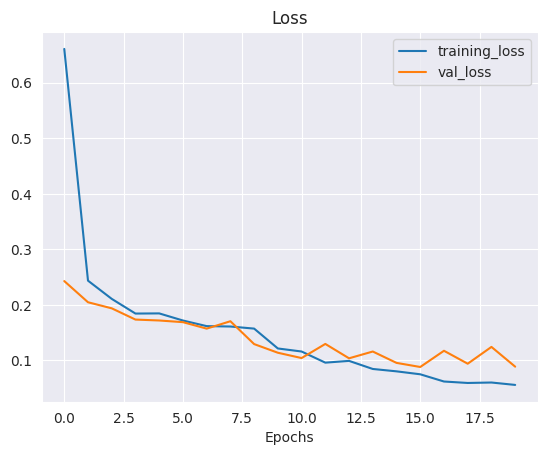

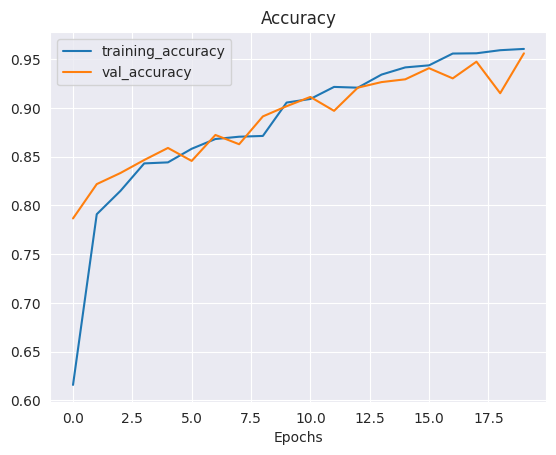

In [268]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 0s 17ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       157
           1       0.99      0.99      0.99       166
           2       0.79      0.86      0.82       152
           3       0.88      0.80      0.84       162

    accuracy                           0.89       637
   macro avg       0.89      0.89      0.89       637
weighted avg       0.89      0.89      0.89       637

Specificity: [0.2868686868686869, 0.346723044397463, 0.25889328063241107, 0.25393700787401574]
Mean Squared Error: : 0.10894988477230072
The average AUC-ROC is 0.9731813313665625


[0.9685534591194969,
 0.6673728813559322,
 0.692144373673036,
 0.6863543788187373,
 0.6519916142557652,
 0.9957627118644068,
 0.6475583864118896,
 0.6659877800407332,
 0.70020964360587,
 0.6779661016949152,
 0.9554140127388535,
 0.714867617107943,
 0.6792452830188679,
 0.6588983050847458,
 0.7048832271762208,
 0.9327902240325866]

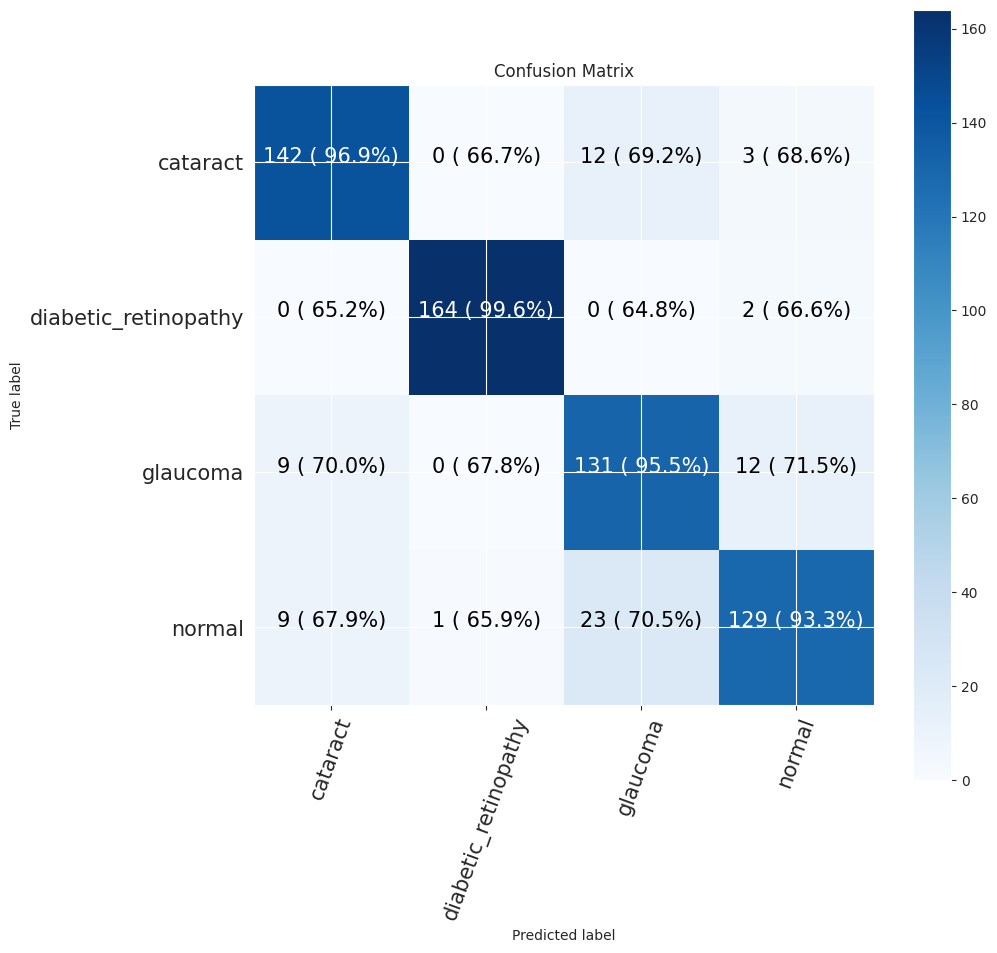

In [269]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


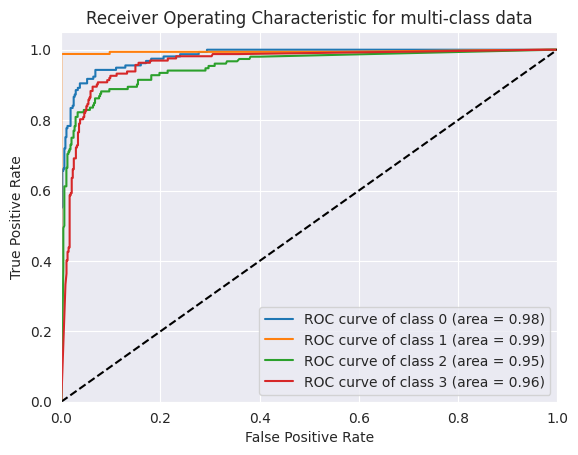

In [270]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [271]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [272]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_31 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_39 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 dense_68 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_69 (Dense)            (None, 4)                 4100      
                                                          

In [273]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

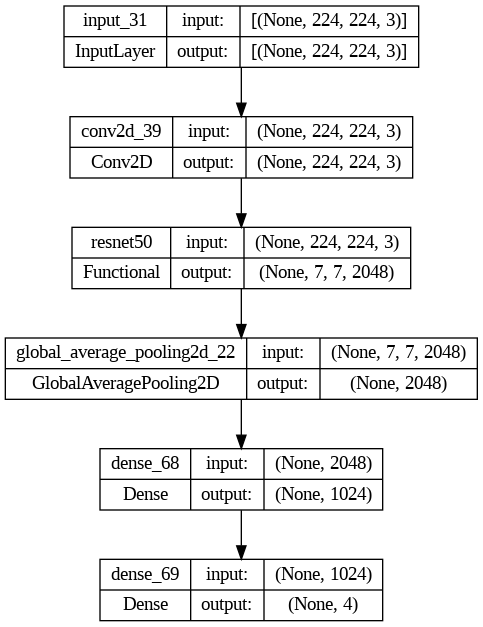

In [274]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [275]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [276]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 40s 301ms/step - loss: 0.2865 - accuracy: 0.7828 - val_loss: 0.1644 - val_accuracy: 0.8771 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 33s 277ms/step - loss: 0.1606 - accuracy: 0.8782 - val_loss: 0.1532 - val_accuracy: 0.8819 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 33s 276ms/step - loss: 0.1303 - accuracy: 0.8964 - val_loss: 0.1081 - val_accuracy: 0.9210 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 33s 276ms/step - loss: 0.1102 - accuracy: 0.9162 - val_loss: 0.0850 - val_accuracy: 0.9362 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 33s 276ms/step - loss: 0.0990 - accuracy: 0.9233 - val_loss: 0.0785 - val_accuracy: 0.9448 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 33s 276ms/step - loss: 0.0802 - accuracy: 0.9415 - val_loss: 0.0703 - val_accuracy: 0.9552 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 2s 93ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       157
           1       1.00      0.99      0.99       166
           2       0.93      0.84      0.89       152
           3       0.87      0.93      0.90       162

    accuracy                           0.94       637
   macro avg       0.94      0.93      0.93       637
weighted avg       0.94      0.94      0.94       637

Specificity: [0.31611570247933884, 0.346723044397463, 0.25147347740667975, 0.31069958847736623]
Mean Squared Error: : 0.10108966380357742
The average AUC-ROC is 0.9912592923206899


[0.991578947368421,
 0.6680761099365751,
 0.69,
 0.6652267818574514,
 0.6505263157894737,
 0.9957716701902748,
 0.668,
 0.6457883369330454,
 0.6905263157894737,
 0.678646934460888,
 0.952,
 0.712742980561555,
 0.6673684210526316,
 0.6575052854122622,
 0.69,
 0.9762419006479481]

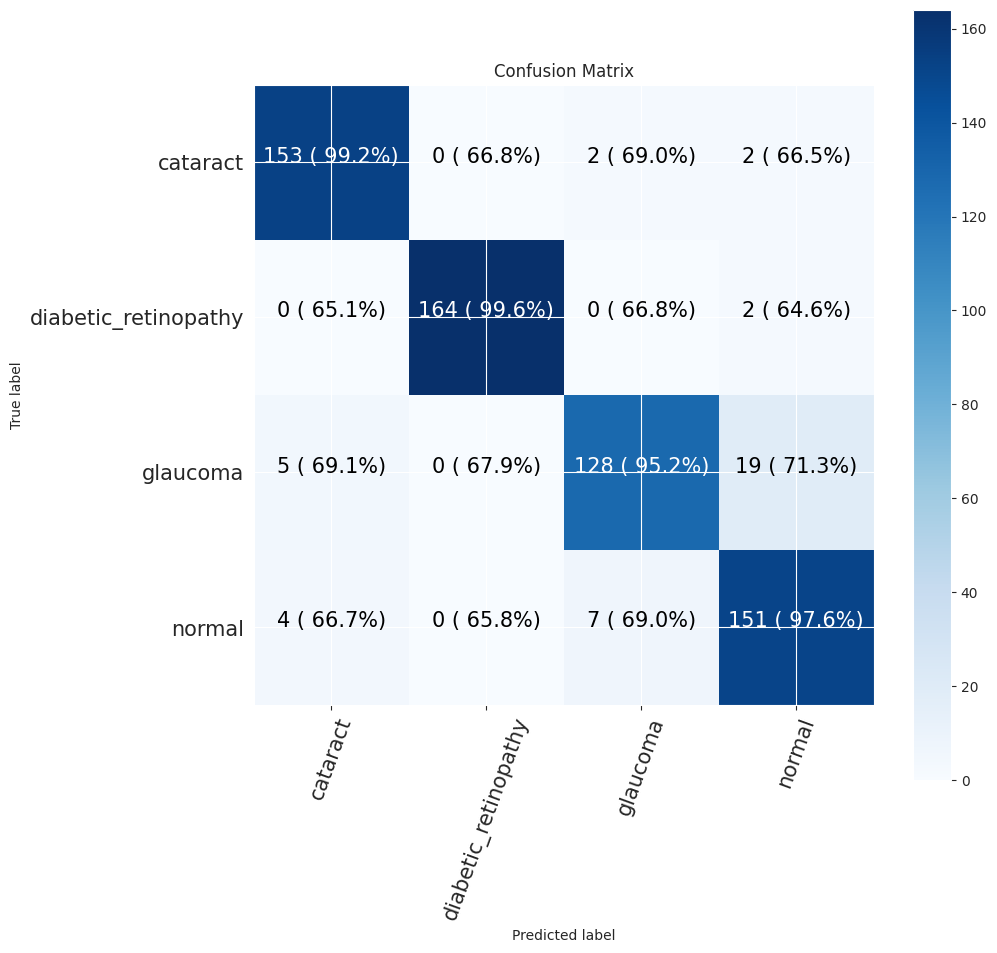

In [277]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


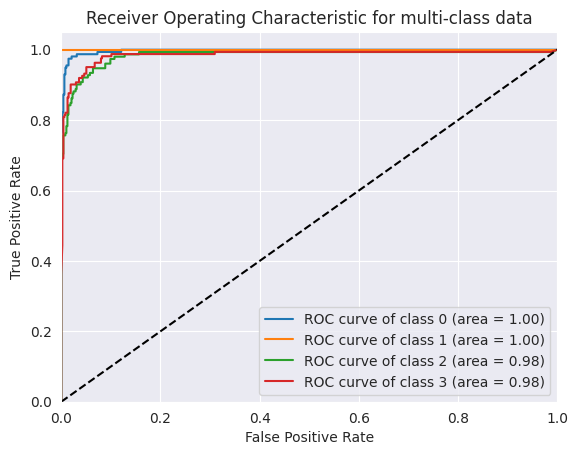

In [278]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [279]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [280]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



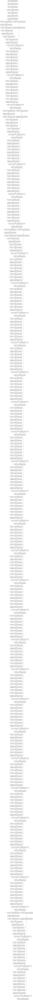

In [281]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [282]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 3 (GlobalAveragePooling2D)                                      
                                                                 
 dense_70 (Dense)            (None, 32)                65568     
                                                                 
 dense_71 (Dense)            (None, 4)                 132       
                                                                 
 activation_15 (Activation)  (None, 4)                 0  

In [283]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [284]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 33s 223ms/step - loss: 0.5939 - accuracy: 0.7609 - val_loss: 0.4191 - val_accuracy: 0.8552 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 25s 211ms/step - loss: 0.3691 - accuracy: 0.8619 - val_loss: 0.3419 - val_accuracy: 0.8733 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 25s 206ms/step - loss: 0.3013 - accuracy: 0.8872 - val_loss: 0.2711 - val_accuracy: 0.8952 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 25s 206ms/step - loss: 0.2574 - accuracy: 0.9012 - val_loss: 0.2499 - val_accuracy: 0.9114 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 25s 208ms/step - loss: 0.2406 - accuracy: 0.9106 - val_loss: 0.2173 - val_accuracy: 0.9162 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 25s 207ms/step - loss: 0.2240 - accuracy: 0.9151 - val_loss: 0.2314 - val_accuracy: 0.9067 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 3s 159ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.93      0.95       157
           1       0.99      0.99      0.99       166
           2       0.85      0.92      0.88       152
           3       0.91      0.89      0.90       162

    accuracy                           0.93       637
   macro avg       0.93      0.93      0.93       637
weighted avg       0.93      0.93      0.93       637

Specificity: [0.2973523421588595, 0.346723044397463, 0.28169014084507044, 0.2920892494929006]
Mean Squared Error: : 0.10322292149066925
The average AUC-ROC is 0.9925892985388788


[0.9774590163934426,
 0.6673728813559322,
 0.6885593220338984,
 0.6743215031315241,
 0.6598360655737705,
 0.9957627118644068,
 0.6483050847457628,
 0.6576200417536534,
 0.6905737704918032,
 0.6779661016949152,
 0.9745762711864406,
 0.7056367432150313,
 0.6721311475409836,
 0.6588983050847458,
 0.6885593220338984,
 0.9624217118997912]

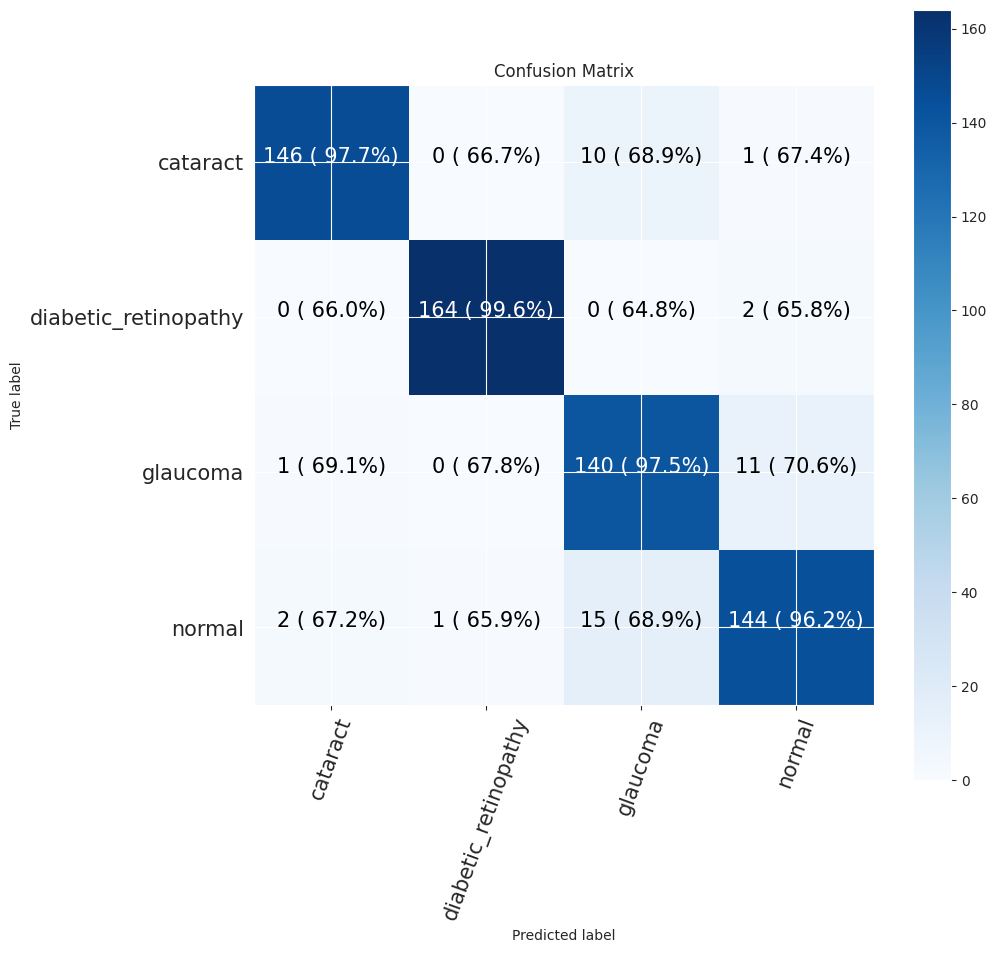

In [285]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


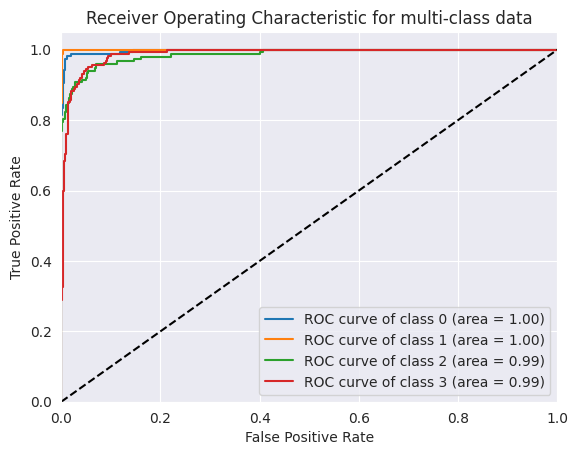

In [286]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 64**

In [287]:
epoch = 20
batchsize = 64

In [288]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 1050 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [289]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [290]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_2  (None, 1536)              0         
 4 (GlobalAveragePooling2D)                                      
                                                                 
 dense_72 (Dense)            (None, 32)                49184     
                                                                 
 dense_73 (Dense)            (None, 4)                 132       
                                                                 
 activation_16 (Activation)  (None, 4)                 0  

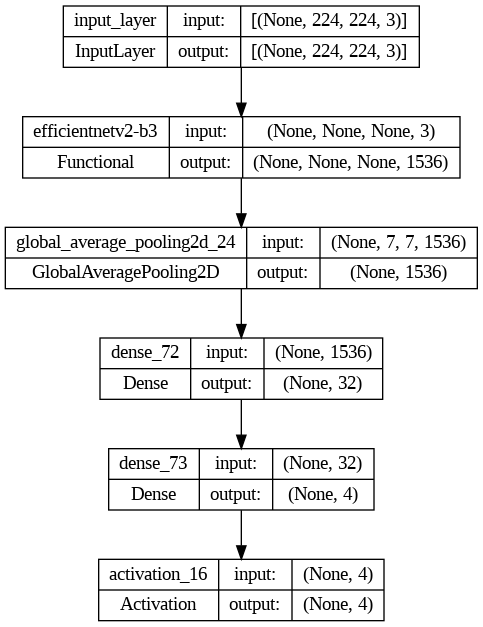

In [291]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [292]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [293]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 26s 251ms/step - loss: 0.6813 - accuracy: 0.7319 - val_loss: 0.4257 - val_accuracy: 0.8305 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 13s 214ms/step - loss: 0.4391 - accuracy: 0.8384 - val_loss: 0.3460 - val_accuracy: 0.8667 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 13s 215ms/step - loss: 0.3970 - accuracy: 0.8490 - val_loss: 0.2910 - val_accuracy: 0.8943 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 13s 213ms/step - loss: 0.3555 - accuracy: 0.8637 - val_loss: 0.2903 - val_accuracy: 0.8933 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 13s 212ms/step - loss: 0.3461 - accuracy: 0.8751 - val_loss: 0.2489 - val_accuracy: 0.9086 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 13s 211ms/step - loss: 0.3241 - accuracy: 0.8790 - val_loss: 0.2409 - val_accuracy: 0.9057 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 13s 211ms/st

EfficientNetV2B3 Evaluation

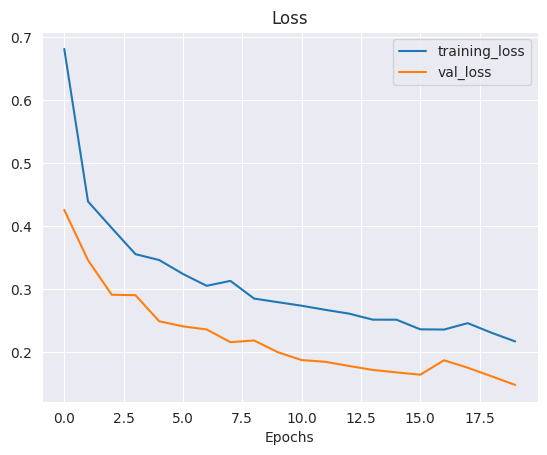

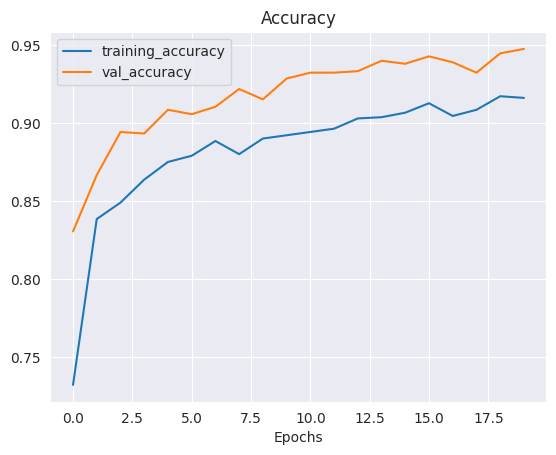

In [294]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 2s 156ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       157
           1       1.00      0.99      0.99       166
           2       0.93      0.86      0.89       152
           3       0.90      0.93      0.92       162

    accuracy                           0.94       637
   macro avg       0.94      0.94      0.94       637
weighted avg       0.94      0.94      0.94       637

Specificity: [0.3188405797101449, 0.346723044397463, 0.2564102564102564, 0.31069958847736623]
Mean Squared Error: : 0.10486890375614166
The average AUC-ROC is 0.9917245765038198


[0.9936440677966102,
 0.6680761099365751,
 0.6881287726358148,
 0.6673773987206824,
 0.6483050847457628,
 0.9957716701902748,
 0.6659959758551308,
 0.650319829424307,
 0.6949152542372882,
 0.678646934460888,
 0.9557344064386318,
 0.7057569296375267,
 0.663135593220339,
 0.6575052854122622,
 0.6901408450704225,
 0.976545842217484]

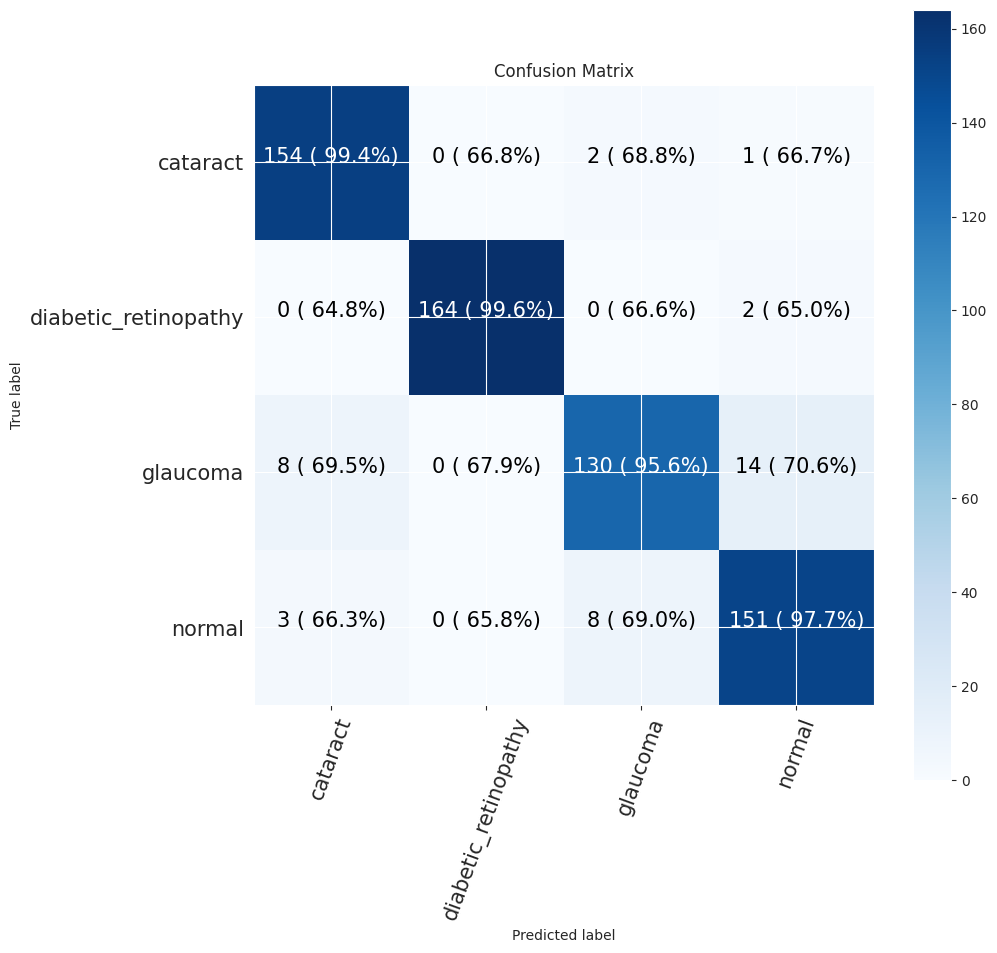

In [295]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


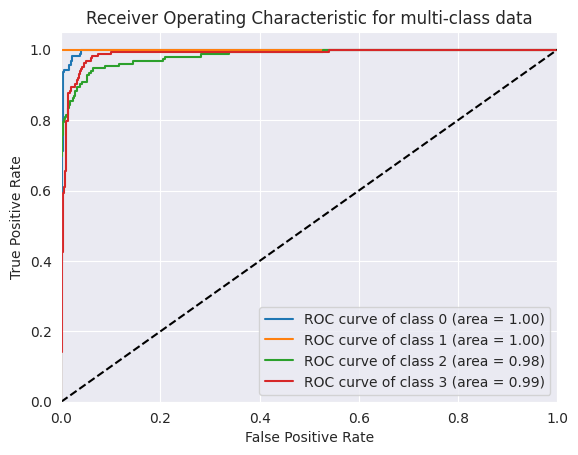

In [296]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [297]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_32 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_41 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_42 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_34 (MaxPooli  (None, 26, 26, 128)      

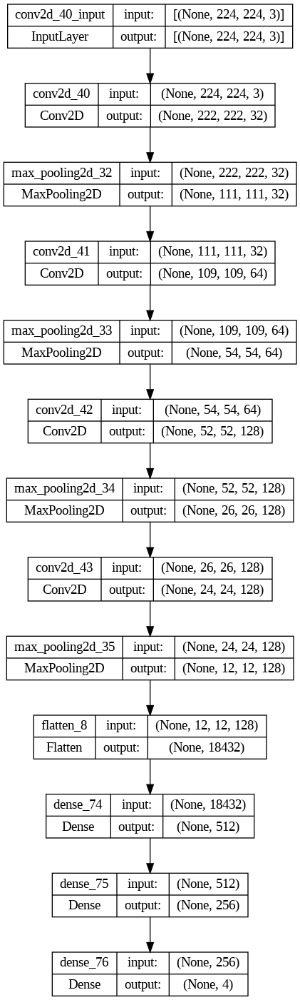

In [298]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [299]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [300]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 9s 106ms/step - loss: 2.5501 - accuracy: 0.5374 - val_loss: 0.3328 - val_accuracy: 0.6752 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 7s 103ms/step - loss: 0.3162 - accuracy: 0.7114 - val_loss: 0.2719 - val_accuracy: 0.7610 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 7s 103ms/step - loss: 0.2455 - accuracy: 0.7736 - val_loss: 0.2420 - val_accuracy: 0.7790 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 7s 104ms/step - loss: 0.2326 - accuracy: 0.7992 - val_loss: 0.2391 - val_accuracy: 0.8000 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 7s 104ms/step - loss: 0.2119 - accuracy: 0.8234 - val_loss: 0.2172 - val_accuracy: 0.8286 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 7s 103ms/step - loss: 0.1943 - accuracy: 0.8308 - val_loss: 0.2066 - val_accuracy: 0.8171 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 7s 103ms/step - lo

CNN Evaluation

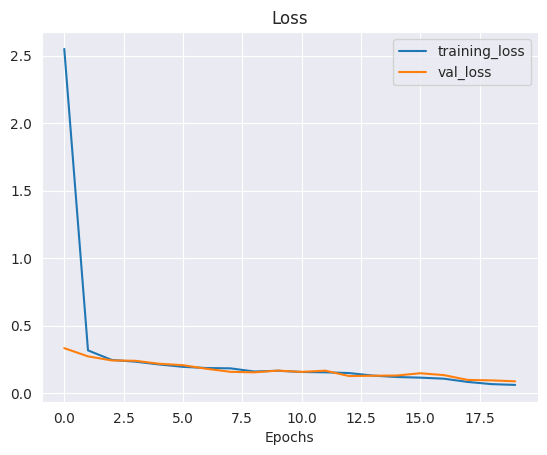

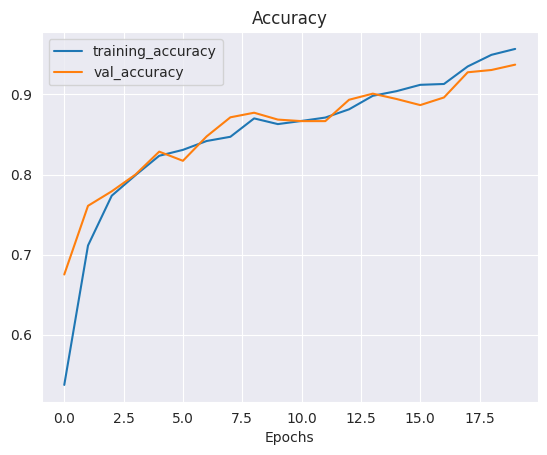

In [301]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 0s 33ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       157
           1       0.99      1.00      1.00       166
           2       0.83      0.80      0.81       152
           3       0.83      0.86      0.85       162

    accuracy                           0.89       637
   macro avg       0.88      0.88      0.88       637
weighted avg       0.89      0.89      0.89       637

Specificity: [0.274, 0.3524416135881104, 0.23449612403100775, 0.28169014084507044]
Mean Squared Error: : 0.10952834784984589
The average AUC-ROC is 0.9725839261131026


[0.9583333333333334,
 0.6659574468085107,
 0.6991869918699187,
 0.6886993603411514,
 0.6541666666666667,
 1.0,
 0.6626016260162602,
 0.6460554371002132,
 0.7125,
 0.676595744680851,
 0.9369918699186992,
 0.7121535181236673,
 0.675,
 0.6574468085106383,
 0.7012195121951219,
 0.9530916844349681]

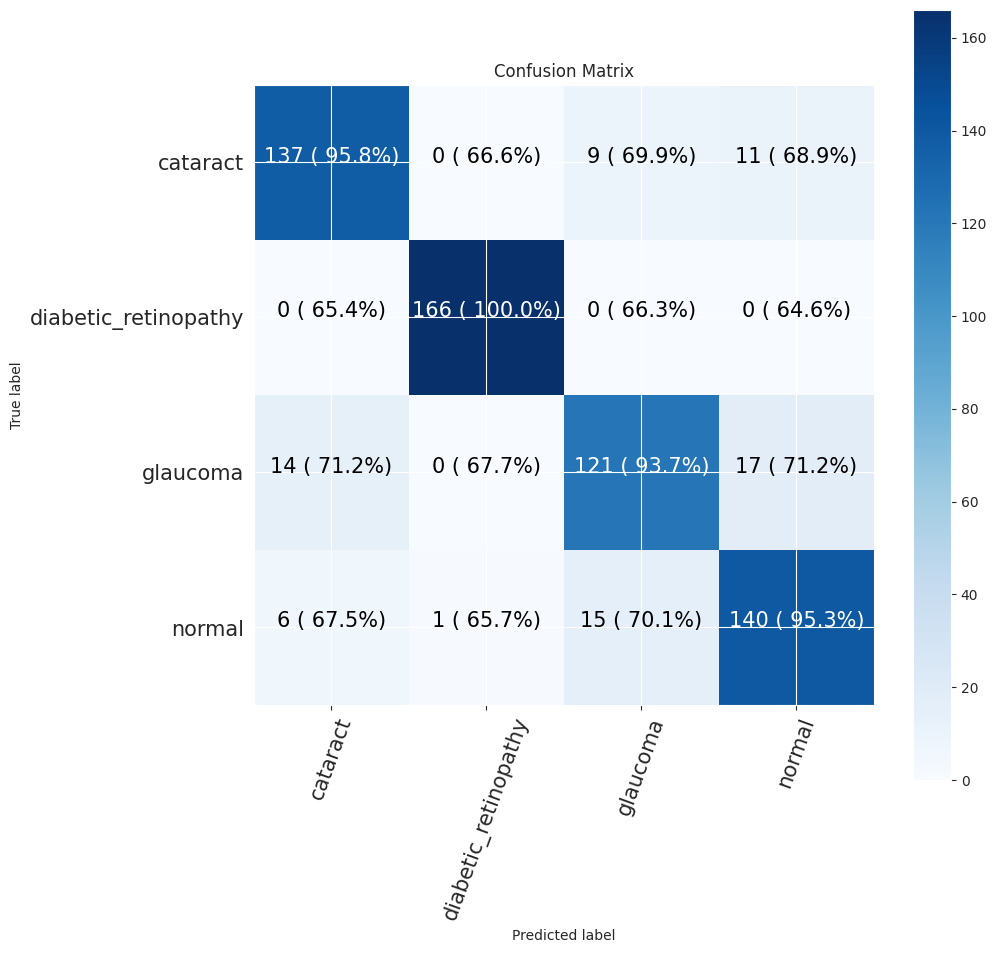

In [302]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


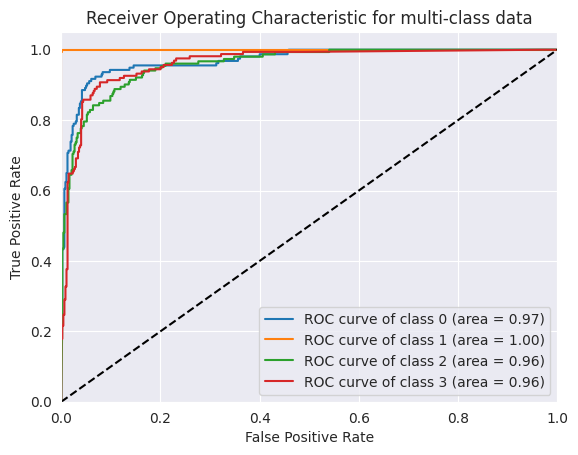

In [303]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [304]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [305]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_35 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_44 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 5 (GlobalAveragePooling2D)                                      
                                                                 
 dense_77 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_78 (Dense)            (None, 4)                 4100      
                                                          

In [306]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

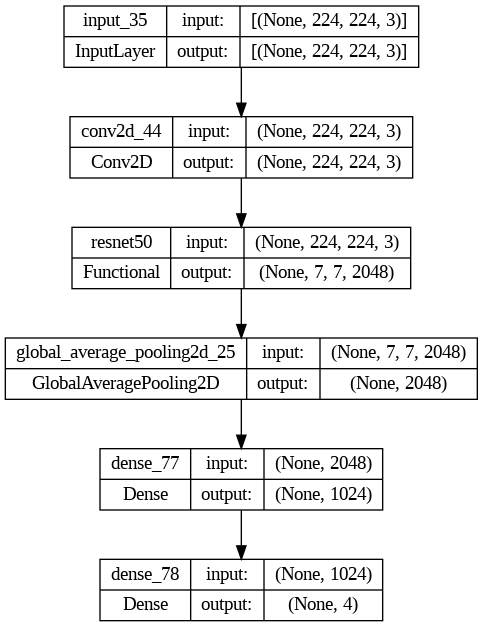

In [307]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [308]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [309]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 37s 555ms/step - loss: 0.3396 - accuracy: 0.7467 - val_loss: 0.1860 - val_accuracy: 0.8524 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 33s 536ms/step - loss: 0.1830 - accuracy: 0.8579 - val_loss: 0.1464 - val_accuracy: 0.8895 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 32s 534ms/step - loss: 0.1493 - accuracy: 0.8838 - val_loss: 0.1264 - val_accuracy: 0.9105 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 32s 535ms/step - loss: 0.1293 - accuracy: 0.9017 - val_loss: 0.1066 - val_accuracy: 0.9200 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 32s 535ms/step - loss: 0.1207 - accuracy: 0.9117 - val_loss: 0.1098 - val_accuracy: 0.9257 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 32s 535ms/step - loss: 0.1080 - accuracy: 0.9146 - val_loss: 0.0892 - val_accuracy: 0.9362 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 32s 536ms/st

ResNet50 Evaluation

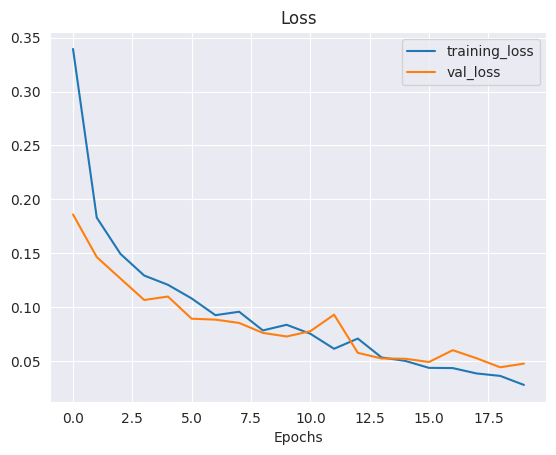

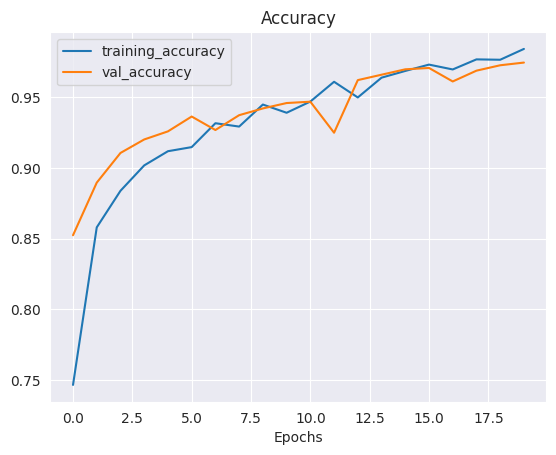

In [310]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 2s 185ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       157
           1       1.00      0.99      1.00       166
           2       0.83      0.95      0.89       152
           3       0.96      0.84      0.90       162

    accuracy                           0.94       637
   macro avg       0.94      0.94      0.94       637
weighted avg       0.94      0.94      0.94       637

Specificity: [0.31611570247933884, 0.3495762711864407, 0.2920892494929006, 0.2714570858283433]
Mean Squared Error: : 0.10195975750684738
The average AUC-ROC is 0.9928498338520796


[0.9916492693110647,
 0.6673728813559322,
 0.6702586206896551,
 0.6834677419354839,
 0.6534446764091858,
 0.9978813559322034,
 0.6443965517241379,
 0.6653225806451613,
 0.6889352818371608,
 0.6779661016949152,
 0.9827586206896551,
 0.7036290322580645,
 0.6659707724425887,
 0.6567796610169492,
 0.7025862068965517,
 0.9475806451612904]

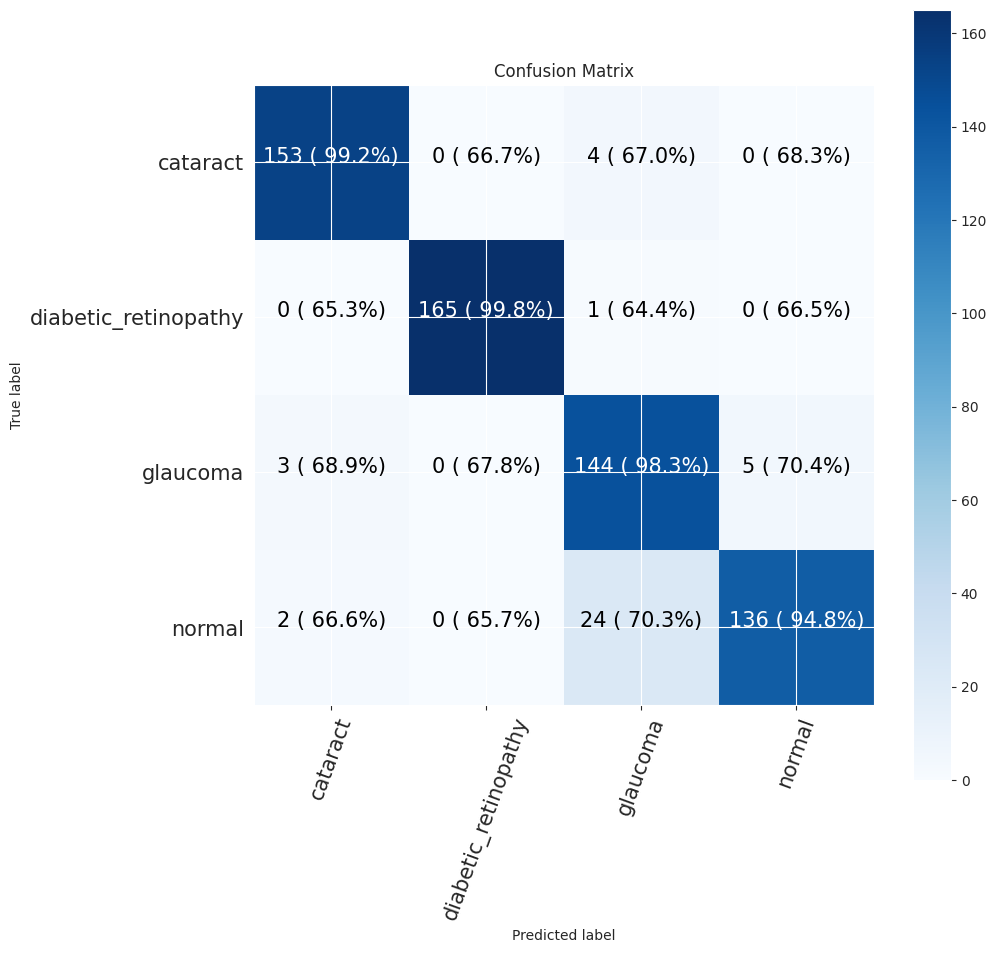

In [311]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


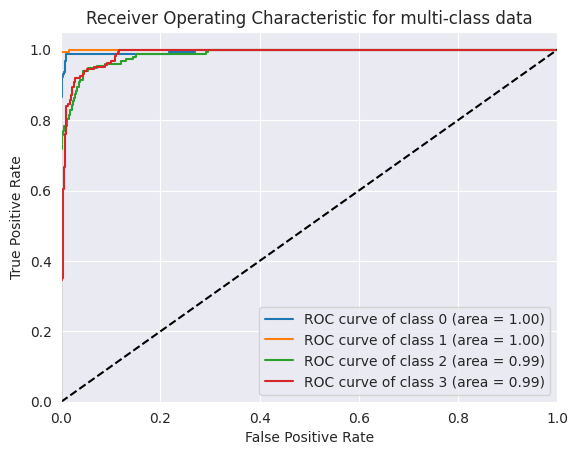

In [312]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [313]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [314]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



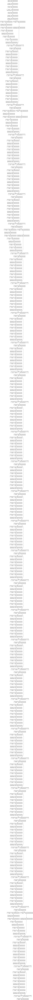

In [315]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [316]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 6 (GlobalAveragePooling2D)                                      
                                                                 
 dense_79 (Dense)            (None, 32)                65568     
                                                                 
 dense_80 (Dense)            (None, 4)                 132       
                                                                 
 activation_17 (Activation)  (None, 4)                 0  

In [317]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [318]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 32s 426ms/step - loss: 0.6540 - accuracy: 0.7314 - val_loss: 0.4183 - val_accuracy: 0.8343 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 25s 407ms/step - loss: 0.4019 - accuracy: 0.8482 - val_loss: 0.3452 - val_accuracy: 0.8695 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 24s 390ms/step - loss: 0.3460 - accuracy: 0.8711 - val_loss: 0.2772 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 24s 388ms/step - loss: 0.2958 - accuracy: 0.8896 - val_loss: 0.3008 - val_accuracy: 0.8790 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 24s 394ms/step - loss: 0.2670 - accuracy: 0.8980 - val_loss: 0.2297 - val_accuracy: 0.9076 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 24s 394ms/step - loss: 0.2349 - accuracy: 0.9096 - val_loss: 0.2216 - val_accuracy: 0.9124 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 24s 392ms/st

ResNet50 Evaluation

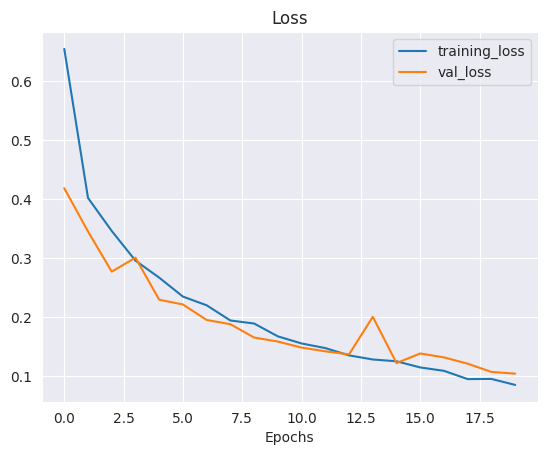

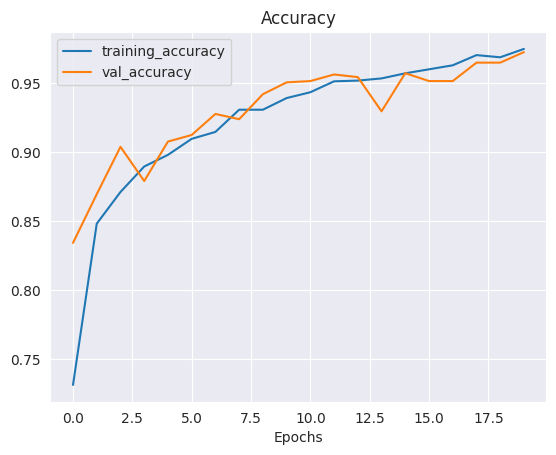

In [319]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 3s 303ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       157
           1       0.98      0.99      0.99       166
           2       0.89      0.93      0.91       152
           3       0.94      0.87      0.90       162

    accuracy                           0.95       637
   macro avg       0.94      0.94      0.94       637
weighted avg       0.95      0.95      0.94       637

Specificity: [0.3215767634854772, 0.3495762711864407, 0.2842741935483871, 0.2842741935483871]
Mean Squared Error: : 0.10384906828403473
The average AUC-ROC is 0.993449830292686


[0.9957983193277311,
 0.6652452025586354,
 0.6764091858037579,
 0.6776180698151951,
 0.6512605042016807,
 0.997867803837953,
 0.6534446764091858,
 0.6611909650924025,
 0.6848739495798319,
 0.6780383795309168,
 0.9770354906054279,
 0.704312114989733,
 0.6680672268907563,
 0.6588486140724946,
 0.6931106471816284,
 0.9568788501026694]

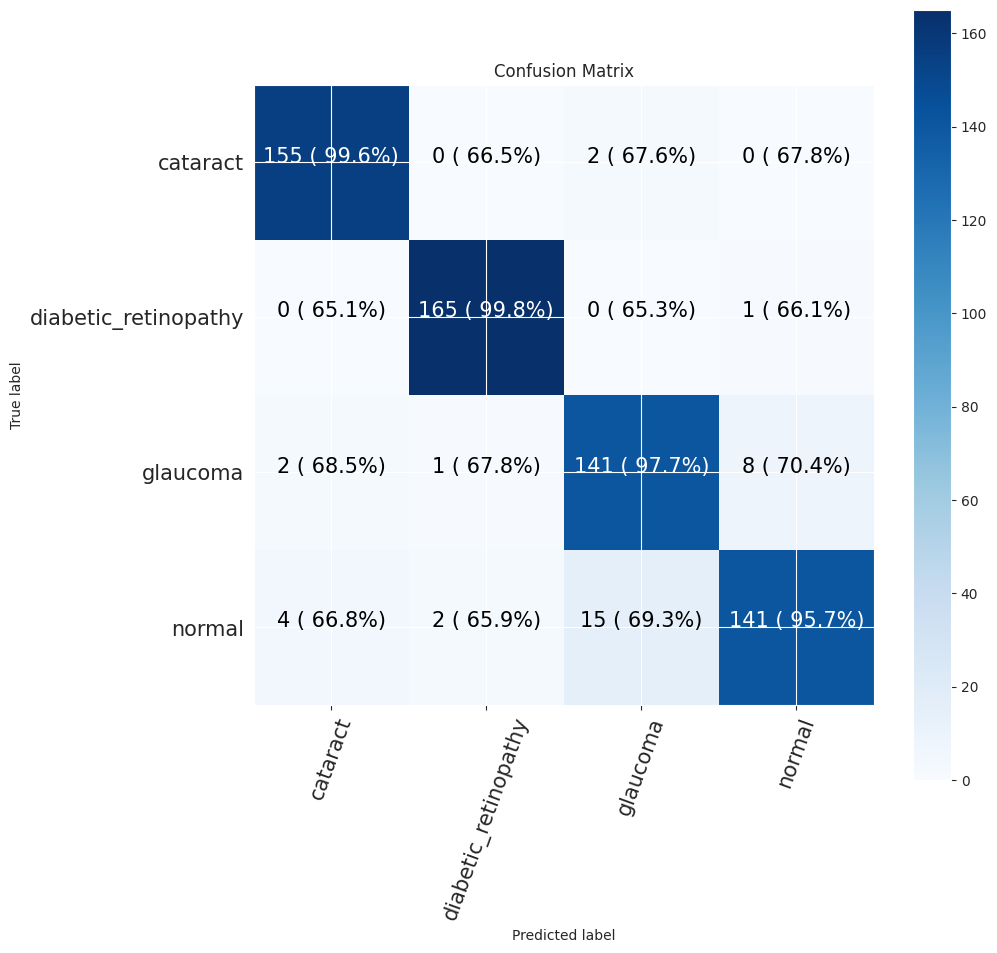

In [320]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


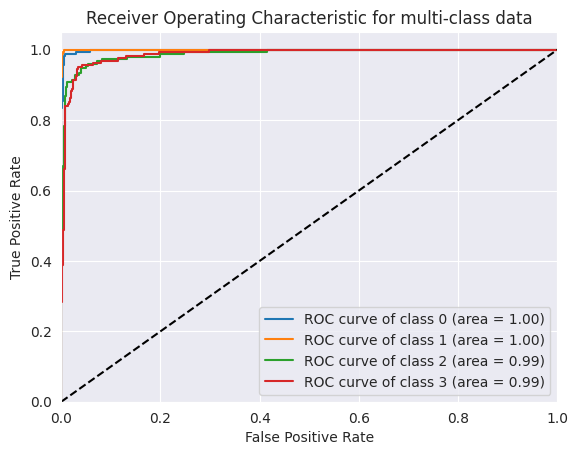

In [321]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()